# <center> <h1> 🧔👨 👨🏾‍🦰 👨‍💻 👱‍♀️ 👩‍🦰👩🏿‍🦰

In [1]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, MaxPool2D, Conv2D, InputLayer
from tensorflow.keras.utils import image_dataset_from_directory
import tensorflow as tf
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing.image import img_to_array, load_img

# <center> We can read the dataset

In [2]:
train_data_dir = "Datasets/gender/train"
test_data_dir = "Datasets/gender/test"

In [3]:
train_data = image_dataset_from_directory(train_data_dir, image_size=(224,224), batch_size=16)
test_data = image_dataset_from_directory(test_data_dir, image_size=(224,224), batch_size=16)


Found 1876 files belonging to 2 classes.
Found 470 files belonging to 2 classes.


In [4]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [5]:
test_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [1]:
# list(train_data)

In [7]:
len(list(train_data))
# There are 118 batches, each batch has 16 images

118

In [8]:
list(train_data)[0]
# 0-bacth

(<tf.Tensor: shape=(16, 224, 224, 3), dtype=float32, numpy=
 array([[[[ 30.       ,  26.       ,  25.       ],
          [ 26.370535 ,  22.370535 ,  21.370535 ],
          [ 21.609375 ,  18.292412 ,  17.975447 ],
          ...,
          [151.12042  , 110.48651  ,  86.169556 ],
          [160.79016  , 118.       ,  91.41968  ],
          [162.       , 118.       ,  89.       ]],
 
         [[ 24.120537 ,  20.120537 ,  19.120537 ],
          [ 25.233139 ,  23.011414 ,  21.418657 ],
          [ 22.899883 ,  21.51868  ,  20.556461 ],
          ...,
          [138.09271  ,  98.74929  ,  73.78709  ],
          [164.06883  , 122.4642   ,  95.291115 ],
          [171.7991   , 127.79911  ,  98.79911  ]],
 
         [[ 19.16741  ,  18.066963 ,  16.100447 ],
          [ 23.885176 ,  22.84549  ,  20.858719 ],
          [ 25.21319  ,  23.871672 ,  22.896225 ],
          ...,
          [120.40688  ,  81.08993  ,  57.411102 ],
          [149.82994  , 108.24962  ,  82.41275  ],
          [181.66518  

In [9]:
len(list(train_data)[0])
# batch 0 is 2 because 1 is images and 2 is labels

2

In [10]:
list(train_data)[0][0][0]
# image 0 of 16 images of Batch 0

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[206.13393   , 198.13393   , 195.13393   ],
        [204.5759    , 196.5759    , 193.5759    ],
        [204.80804   , 196.80804   , 193.80804   ],
        ...,
        [ 52.808025  ,  49.808025  ,  44.808025  ],
        [ 59.863964  ,  54.863964  ,  50.863964  ],
        [ 62.129295  ,  57.129295  ,  53.129295  ]],

       [[204.1722    , 197.1722    , 191.1722    ],
        [203.36287   , 196.36287   , 190.36287   ],
        [202.63394   , 195.63394   , 189.63394   ],
        ...,
        [ 53.693806  ,  48.693806  ,  44.693806  ],
        [ 47.890694  ,  42.890694  ,  38.890694  ],
        [ 56.221313  ,  51.94229   ,  48.66327   ]],

       [[203.04668   , 196.04668   , 190.04668   ],
        [202.16295   , 195.16295   , 189.16295   ],
        [202.        , 195.        , 189.        ],
        ...,
        [ 59.906445  ,  54.906445  ,  50.906445  ],
        [ 42.108875  ,  37.261288  ,  34.261288  ],
        [ 45.44964

In [11]:
list(train_data)[0][0][0].shape
# image size 0 of 16 images of batch 0i

TensorShape([224, 224, 3])

In [12]:
classes = train_data.class_names
classes

['man', 'woman']

In [13]:
list(train_data)[0][1]
# bacth image labels

<tf.Tensor: shape=(16,), dtype=int32, numpy=array([1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1])>

In [14]:
list(train_data)[0][1]
# these also come out different every time. That is, it releases different batches every time

<tf.Tensor: shape=(16,), dtype=int32, numpy=array([1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1])>

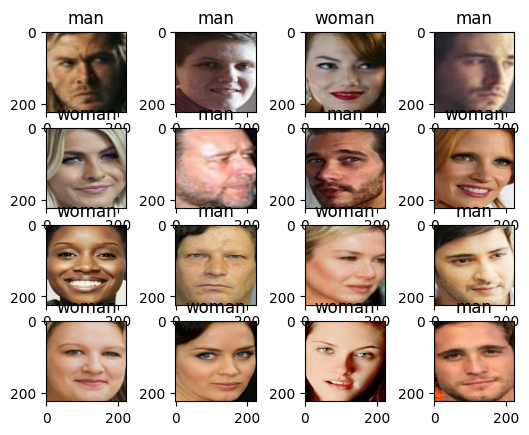

In [15]:
for rasm, label in train_data.take(1):
    
    for i in range(16):
        ax = plt.subplot(4,4,i+1)
        plt.title(classes[label[i]])
        plt.imshow(rasm[i].numpy().astype("uint8"))

In [16]:
model1 = Sequential([
    InputLayer((224,224,3)),
    
    Conv2D(8, (3,3), padding="same", activation="relu"),
    MaxPool2D(2,2),  #112x112x8
    
    Conv2D(16, (3,3), padding="same", activation="relu"),
    
    
    MaxPool2D(2,2),  #56x56x16
    
    Conv2D(32, (3,3), padding="same", activation="relu"),
    MaxPool2D(2,2),  #28x82x32
    
    Conv2D(48, (3,3), padding="same", activation="relu"),
    MaxPool2D(2,2),  #14x14x48
    
    Conv2D(64, (3,3), padding="same", activation="relu"),
    MaxPool2D(2,2),  #7x7x64
    
    Flatten(),
    
    Dense(1000, activation="relu"),
    
    
    Dense(100, activation="relu"),
    
    
    Dense(100, activation="relu"),
    
    
    Dense(2, activation="softmax")
    
])

In [17]:
model1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 8)       224       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 8)      0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 16)      1168      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 56, 56, 16)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 32)        4640      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 28, 28, 32)       0

In [18]:
model1.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics="accuracy")

In [19]:
with tf.device(":/GPU:0"):
    model1.fit(train_data, epochs=10,  batch_size=16)

Epoch 1/10
118/118 [==============================] - 19s 43ms/step - loss: 1.3388 - accuracy: 0.7377
Epoch 2/10
118/118 [==============================] - 15s 128ms/step - loss: 0.3690 - accuracy: 0.8342
Epoch 3/10
118/118 [==============================] - 10s 83ms/step - loss: 0.2610 - accuracy: 0.8870
Epoch 4/10
118/118 [==============================] - 8s 66ms/step - loss: 0.2003 - accuracy: 0.9200
Epoch 5/10
118/118 [==============================] - 12s 101ms/step - loss: 0.1464 - accuracy: 0.9408
Epoch 6/10
118/118 [==============================] - 11s 96ms/step - loss: 0.1368 - accuracy: 0.9430
Epoch 7/10
118/118 [==============================] - 11s 95ms/step - loss: 0.1659 - accuracy: 0.9280
Epoch 8/10
118/118 [==============================] - 10s 84ms/step - loss: 0.1107 - accuracy: 0.9611
Epoch 9/10
118/118 [==============================] - 11s 95ms/step - loss: 0.1072 - accuracy: 0.9584
Epoch 10/10
118/118 [==============================] - 12s 97ms/step - loss: 0.09

In [20]:
model1.evaluate(test_data)

30/30 [==============================] - 4s 82ms/step - loss: 0.3398 - accuracy: 0.9128


[0.33984804153442383, 0.9127659797668457]

In [22]:
model1.layers

# <center> View the kernels on each convolution layer

conv2d
8


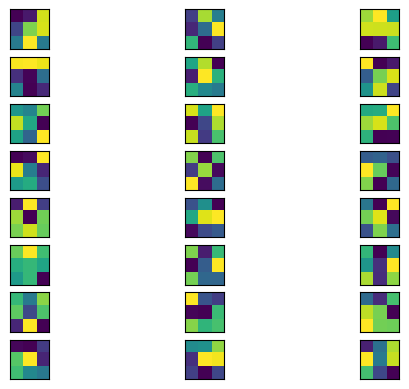

conv2d_1
16


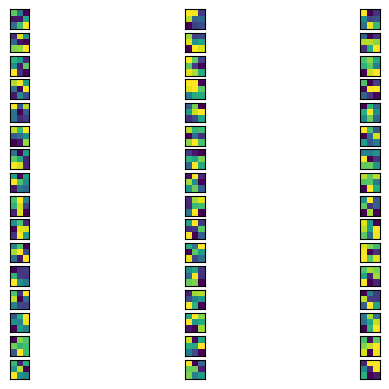

conv2d_2
32


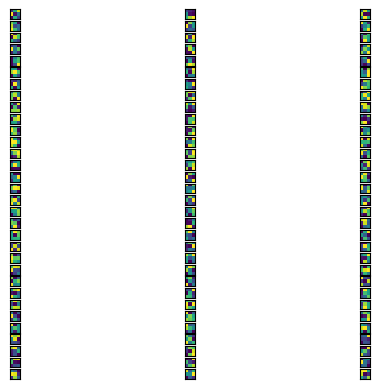

conv2d_3
48


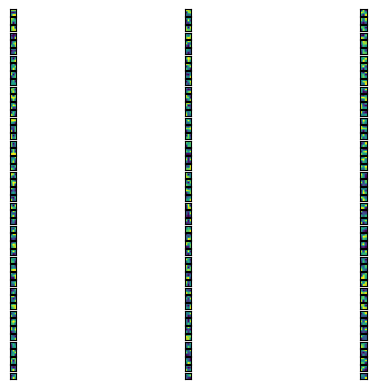

conv2d_4
64


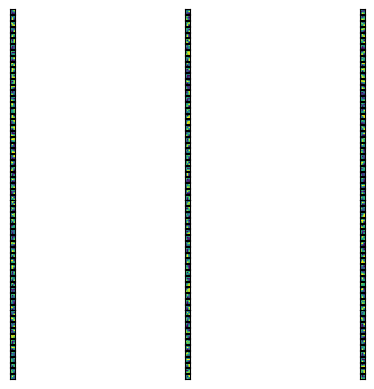

In [35]:
for layer in model1.layers:
     # we only get convvalution layers
    if 'conv' in layer.name:
        weights, bias= layer.get_weights()
        print(layer.name) 
        
        
        # we will find how many filters are in each conv layer
        f_min, f_max = weights.min(), weights.max()
        filters = (weights - f_min) / (f_max - f_min)  
        print(filters.shape[3])  
        filter_cnt=1
        
        
        #plotting all the filters
        for i in range(filters.shape[3]):  # we loop through each filter 8,16,32,48,64
            #get the filters
            filt=filters[:,:,:, i]   # through the loop we enter the 3 size filter inside each 8,16,32,48,64 filter
            
            # we draw a 3-dimensional filter on each channel
            for j in range(filters.shape[0]):
                ax= plt.subplot(filters.shape[3], filters.shape[0], filter_cnt  )
                ax.set_xticks([])
                ax.set_yticks([])
                plt.imshow(filt[:,:, j])
                filter_cnt+=1
        plt.show()

In [56]:
img_path = "Photo/man1.jpg"

img_path

'Photo/man1.jpg'

In [57]:
successive_outputs = [layer.output for layer in model1.layers[1:]]
successive_outputs

[<KerasTensor: shape=(None, 112, 112, 8) dtype=float32 (created by layer 'max_pooling2d')>,
 <KerasTensor: shape=(None, 112, 112, 16) dtype=float32 (created by layer 'conv2d_1')>,
 <KerasTensor: shape=(None, 56, 56, 16) dtype=float32 (created by layer 'max_pooling2d_1')>,
 <KerasTensor: shape=(None, 56, 56, 32) dtype=float32 (created by layer 'conv2d_2')>,
 <KerasTensor: shape=(None, 28, 28, 32) dtype=float32 (created by layer 'max_pooling2d_2')>,
 <KerasTensor: shape=(None, 28, 28, 48) dtype=float32 (created by layer 'conv2d_3')>,
 <KerasTensor: shape=(None, 14, 14, 48) dtype=float32 (created by layer 'max_pooling2d_3')>,
 <KerasTensor: shape=(None, 14, 14, 64) dtype=float32 (created by layer 'conv2d_4')>,
 <KerasTensor: shape=(None, 7, 7, 64) dtype=float32 (created by layer 'max_pooling2d_4')>,
 <KerasTensor: shape=(None, 3136) dtype=float32 (created by layer 'flatten')>,
 <KerasTensor: shape=(None, 1000) dtype=float32 (created by layer 'dense')>,
 <KerasTensor: shape=(None, 100) dty

In [58]:
visualization_model = tf.keras.models.Model(inputs = model1.input, outputs = successive_outputs)
visualization_model

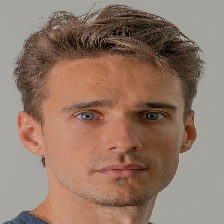

In [59]:
img = load_img(img_path, target_size=(224, 224))
img

In [60]:
x = img_to_array(img)                           
x.shape

(224, 224, 3)

In [61]:
x = x.reshape((1,) + x.shape)
x.shape

(1, 224, 224, 3)

In [62]:
x /= 255.0
x

array([[[[0.64705884, 0.6431373 , 0.62352943],
         [0.64705884, 0.6431373 , 0.62352943],
         [0.64705884, 0.6431373 , 0.62352943],
         ...,
         [0.63529414, 0.6313726 , 0.6117647 ],
         [0.63529414, 0.6313726 , 0.6117647 ],
         [0.63529414, 0.6313726 , 0.6117647 ]],

        [[0.64705884, 0.6431373 , 0.62352943],
         [0.64705884, 0.6431373 , 0.62352943],
         [0.64705884, 0.6431373 , 0.62352943],
         ...,
         [0.63529414, 0.6313726 , 0.6117647 ],
         [0.63529414, 0.6313726 , 0.6117647 ],
         [0.63529414, 0.6313726 , 0.6117647 ]],

        [[0.6509804 , 0.64705884, 0.627451  ],
         [0.6509804 , 0.64705884, 0.627451  ],
         [0.6509804 , 0.64705884, 0.627451  ],
         ...,
         [0.63529414, 0.6313726 , 0.6117647 ],
         [0.63529414, 0.6313726 , 0.6117647 ],
         [0.63529414, 0.6313726 , 0.6117647 ]],

        ...,

        [[0.6627451 , 0.64705884, 0.63529414],
         [0.6627451 , 0.64705884, 0.63529414]

In [63]:
successive_feature_maps = visualization_model.predict(x)
successive_feature_maps

1/1 [==============================] - 0s 125ms/step


[array([[[[0.        , 0.01038814, 0.2533608 , ..., 0.08445642,
           0.06423306, 0.        ],
          [0.        , 0.01313585, 0.14656132, ..., 0.        ,
           0.06575097, 0.        ],
          [0.        , 0.01572319, 0.14681901, ..., 0.        ,
           0.06515463, 0.        ],
          ...,
          [0.        , 0.01420676, 0.14352746, ..., 0.        ,
           0.06205516, 0.        ],
          [0.        , 0.01420676, 0.14352746, ..., 0.        ,
           0.06205516, 0.        ],
          [0.        , 0.48954368, 0.14352746, ..., 0.        ,
           0.06205516, 0.        ]],
 
         [[0.        , 0.01550778, 0.        , ..., 0.08627921,
           0.06509225, 0.        ],
          [0.        , 0.01463452, 0.        , ..., 0.        ,
           0.0664366 , 0.        ],
          [0.        , 0.01332204, 0.        , ..., 0.        ,
           0.0646636 , 0.        ],
          ...,
          [0.        , 0.01389179, 0.        , ..., 0.        ,
   

In [64]:
layer_names = [layer.name for layer in model1.layers]
layer_names

['conv2d',
 'max_pooling2d',
 'conv2d_1',
 'max_pooling2d_1',
 'conv2d_2',
 'max_pooling2d_2',
 'conv2d_3',
 'max_pooling2d_3',
 'conv2d_4',
 'max_pooling2d_4',
 'flatten',
 'dense',
 'dense_1',
 'dense_2',
 'dense_3']

# <center> View images filtered through each layer

(1, 112, 112, 8)
(1, 112, 112, 16)


C:\Users\djdle\AppData\Local\Temp\ipykernel_15528\3652223147.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure( figsize=(scale * n_features, scale) )


(1, 56, 56, 16)
(1, 56, 56, 32)


C:\Users\djdle\AppData\Local\Temp\ipykernel_15528\3652223147.py:17: RuntimeWarning: invalid value encountered in divide
  x /= x.std ()
C:\Users\djdle\AppData\Local\Temp\ipykernel_15528\3652223147.py:20: RuntimeWarning: invalid value encountered in cast
  x  = np.clip(x, 0, 255).astype('uint8')


(1, 28, 28, 32)
(1, 28, 28, 48)
(1, 14, 14, 48)
(1, 14, 14, 64)
(1, 7, 7, 64)
(1, 3136)


IndexError: too many indices for array: array is 2-dimensional, but 4 were indexed

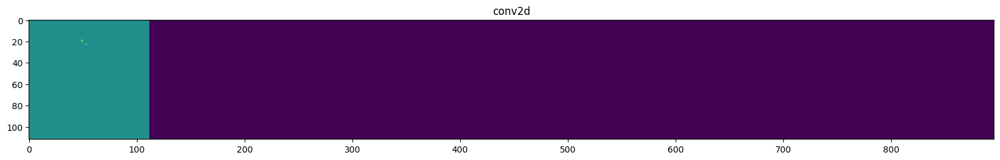

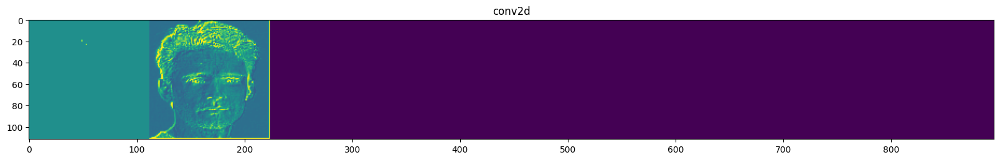

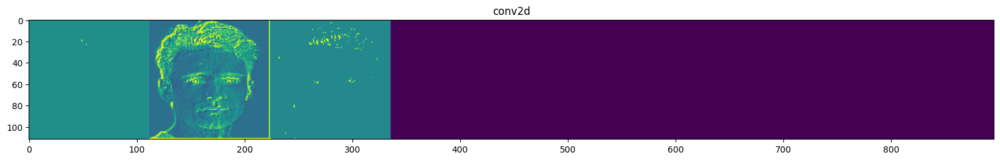

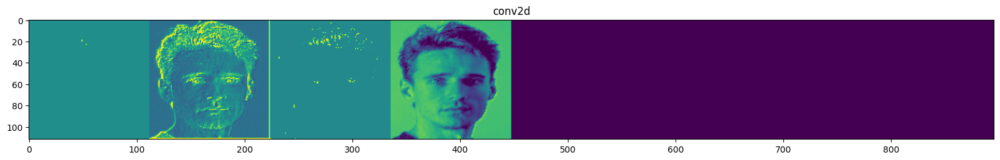

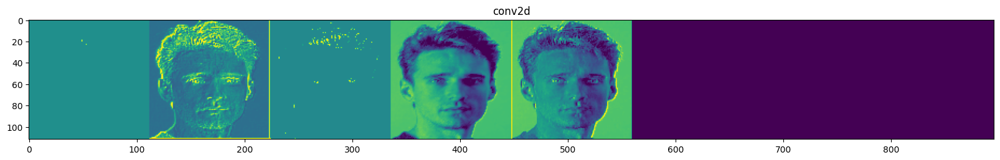

...

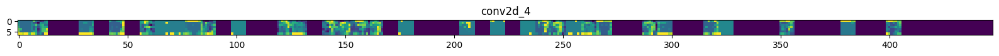

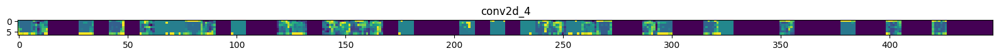

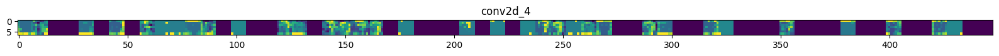

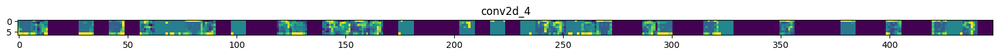

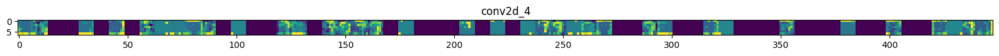

In [65]:
for layer_name, feature_map in zip(layer_names, successive_feature_maps):
    print(feature_map.shape)
    if len(feature_map.shape) == 4:
    
    # Plot Feature maps for the conv / maxpool layers, not the fully-connected layers
   
        n_features = feature_map.shape[-1]  # number of features in the feature map
        size       = feature_map.shape[ 1]  # feature map shape (1, size, size, n_features)
    
    # We will tile our images in this matrix
        display_grid = np.zeros((size, size * n_features))
    
    # Postprocess the feature to be visually palatable
    for i in range(n_features):
        x  = feature_map[0, :, :, i]
        x -= x.mean()
        x /= x.std ()
        x *=  64
        x += 128
        x  = np.clip(x, 0, 255).astype('uint8')
      # Tile each filter into a horizontal grid
        display_grid[:, i * size : (i + 1) * size] = x# Display the grid
        scale = 20. / n_features
        plt.figure( figsize=(scale * n_features, scale) )
        plt.title ( layer_name )
        plt.grid  ( False )
        plt.imshow( display_grid, aspect='auto', cmap='viridis' )

# <center> Predict

In [66]:
train_data.class_names

['man', 'woman']

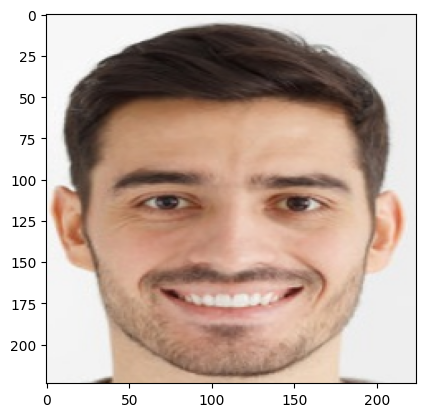

In [74]:
rasm = cv2.imread("Photo/man2.jpg")
rasm = cv2.cvtColor(rasm, cv2.COLOR_BGR2RGB)
rasm = cv2.resize(rasm, (224,224))
plt.imshow(rasm)

In [75]:
rasm = np.expand_dims(rasm,  axis=0)
rasm.shape

(1, 224, 224, 3)

In [76]:
predict = model1.predict(rasm)
predict

1/1 [==============================] - 0s 16ms/step


array([[0.92906237, 0.0709376 ]], dtype=float32)

In [78]:
sinf = np.argmax(predict)
sinf
if sinf==0:
    print("Man")
else:
    print("Woman")

Man


# <center> <h1> 👨‍💻   🚀  